In [1]:
from __future__ import print_function, division
import copy
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import time
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import datasets, models, transforms, utils
import torchvision
from datetime import datetime
print(torch.__version__)
print(torchvision.__version__)

%matplotlib inline

0.4.1
0.2.1


In [2]:
class DeepLesionDataset(Dataset):
    """DeepLesion dataset."""

    def __init__(self, csv_file, root_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.data_frame = pd.read_table(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):


        img_name = os.path.join(self.root_dir,
                                os.path.join(
                                    *self.data_frame.iloc[idx, 0].rsplit('_', 1)
                                ))

        image = io.imread(img_name).astype(np.int32)
#         image = np.expand_dims(image, axis=2)
        image = image - 32768
        image = image.astype(np.int32)
        

        
#         img_min = image.min()
#         img_max = image.max()
        
#         low_bound = -500
#         high_bound = 500
        
        
#         channel_1 = (((image-img_min)/(low_bound-img_min))*255).clip(0, 255)
#         channel_2 = (((image-low_bound)/(high_bound-low_bound))*255).clip(0, 255)
#         channel_3 = (((image-high_bound)/(img_max-high_bound))*255).clip(0, 255)

#         image = np.zeros((3, image.shape[0], image.shape[1]))
#         image[0] = channel_1
#         image[1] = channel_2
#         image[2] = channel_3
#         image = image.astype(np.uint8).transpose(1,2,0)
        image = np.expand_dims(image, axis=2)
        image = image.astype(np.float32)#.transpose(1,2,0)

        bounding_box = np.array(self.data_frame.iloc[idx].Bounding_boxes.split(','))
        bounding_box = bounding_box.astype('float').reshape(-1, 2)
        label = self.data_frame.iloc[idx].Coarse_lesion_type.astype(int) - 1


#         bounding_box = [c_x1, c_y1, c_x2, c_y2]

        
        # TODO: Needs to be relative to the cell
        c_x =  ((bounding_box[1][0] + bounding_box[0][0])/2) / image.shape[0]
        c_y =  ((bounding_box[1][1] + bounding_box[0][1])/2) / image.shape[1]
        c_hw = (bounding_box[1][0] - bounding_box[0][0]) / image.shape[0]
        c_hh = (bounding_box[1][1] - bounding_box[0][1]) / image.shape[1]

      
        grid_dim = 13
        target = torch.zeros((grid_dim,grid_dim), dtype=torch.long)
        
        cell_dim = 1 / grid_dim

     
        target[int(c_y // cell_dim), int(c_x // cell_dim)] = 1
        
        
        if self.transform:
            image = self.transform(image)
    
        return image, target, torch.tensor([c_x - c_hw/2, c_y - c_hh/2, c_hw, c_hh])

d = DeepLesionDataset('../sets/train_set_small.tsv', '/media/mark/Data/deeplesion/Images_png',
                     transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(416),
        transforms.ToTensor(),
        transforms.Normalize([0], [1024])
                     ])
                     )
idx = 1
p_bb = []#
# print(d[0][2])
# t_bb = conf_bboxes(d[idx][1])
# t_bb
# imshow(d[idx][0], d[idx][2], 7*13+6)
# for i in d:
#     pass
# print(d[0][0].numpy().transpose(1, 2, 0).shape)
# for row in d[0][0].squeeze().numpy():
#     print(row)
# plt.close('all')
# fig,ax = plt.subplots(1, figsize=(5,5))
# fig = plt.figure(figsize=(5, 5))
# _ = plt.imshow(d[0][0].squeeze().numpy())
# plt.show()
# bb_x = d['bounding_box'][0,0]
# bb_y = d['bounding_box'][0,1]
# bb_w = d['bounding_box'][1,0] - d['bounding_box'][0,0] 
# bb_h = d['bounding_box'][0,1] - d['bounding_box'][1,1]
# rect1 = patches.Rectangle((bb_x,bb_y),bb_w,bb_h,linewidth=1,edgecolor='r',facecolor='none')
# ax.add_patch(rect1)

In [39]:
def imshow(inp, bb, preds, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().squeeze()

    colors = ['orange', 'w', 'w']
#     inp = inp.numpy().transpose((1, 2, 0))
#     print(inp.shape)
    mean = np.array([0])
    std = np.array([1024])
    inp = std * inp + mean
#     inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(8, 8))
    _ = plt.imshow(inp)
    ax = plt.gca()
    ax.add_patch(patches.Rectangle(
        (
            (bb[0]) * inp.shape[0],
            (bb[1]) * inp.shape[1]
        ),
        (bb[2]) * inp.shape[0],
        (bb[3]) * inp.shape[1],
        linewidth=1,edgecolor='r',facecolor='none'))
    for i, pred in enumerate(preds):
        p_x = (pred.item()%13) * 1/13
        p_y = (pred.item()//13) * 1/13
        p_w = 1/13
        p_h = 1/13
        ax.add_patch(patches.Rectangle(
            (
                (p_x) * inp.shape[0],
                (p_y) * inp.shape[1]
            ),
            (p_w) * inp.shape[0],
            (p_h) * inp.shape[1],
            linewidth=1,edgecolor=colors[i],facecolor='none'))
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated
#     plt.show()

# inputs, classes, bb = next(iter(dataloaders['train']))   

# out = torchvision.utils.make_grid(inputs)
# inputs
# imshow(out)

(tensor([0.1245, 0.0829, 0.0673], device='cuda:0'), tensor([123,  20,  85], device='cuda:0'))
tensor([[123,  20,  85],
        [ 74,  73,  70],
        [ 60,  97,  74],
        [ 84,  71,  45],
        [ 72,  45,  63],
        [ 72,  71,  69],
        [ 86,  85,  98],
        [ 86,  85,  98]], device='cuda:0')


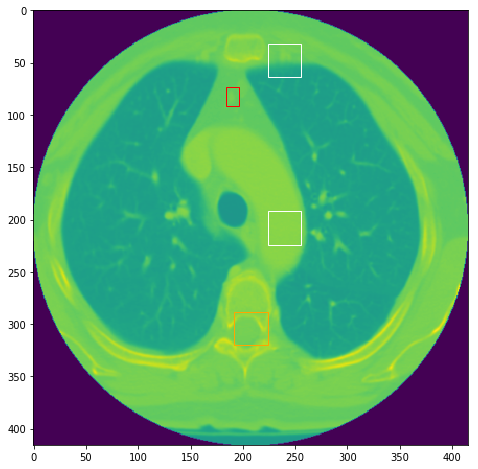

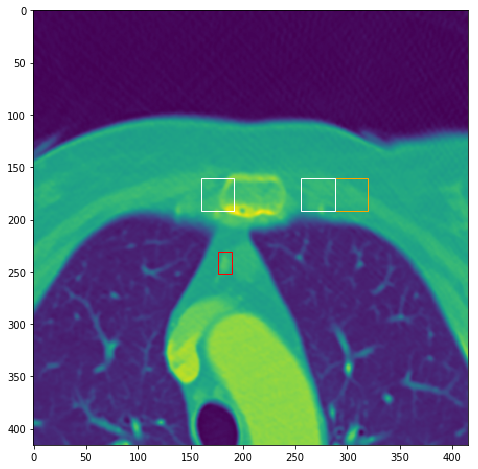

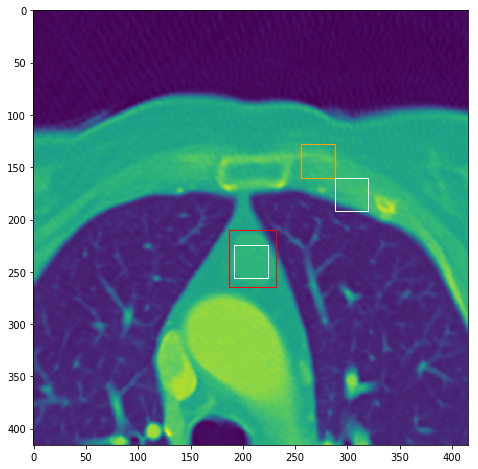

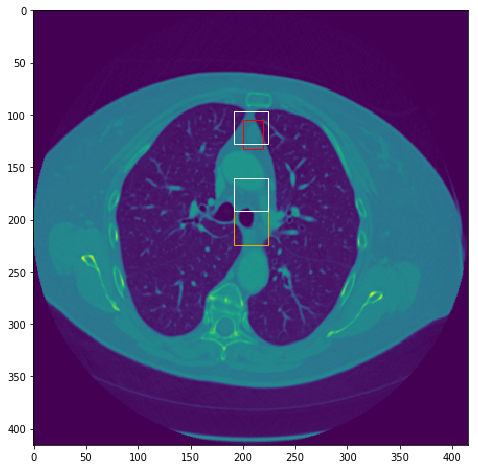

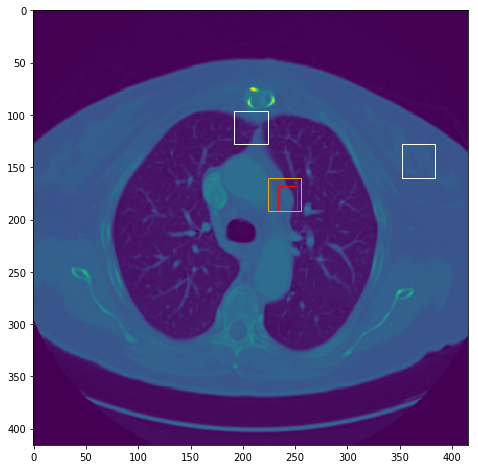

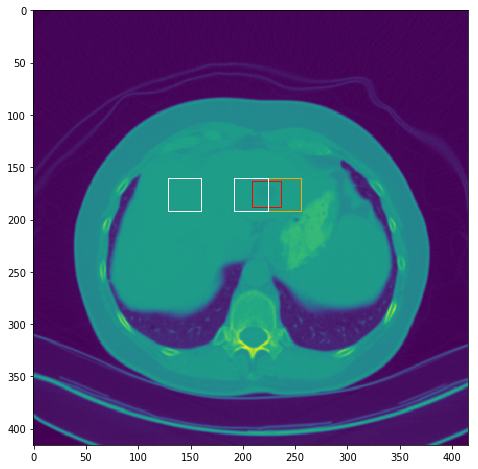

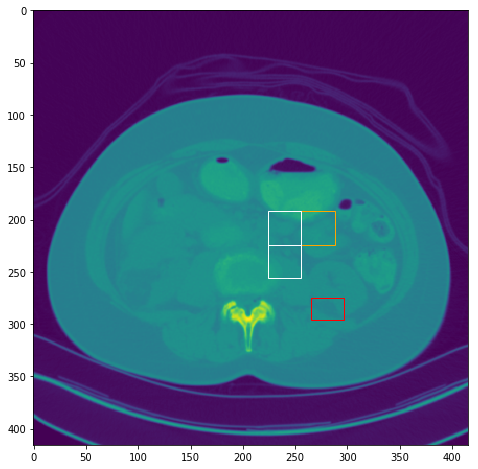

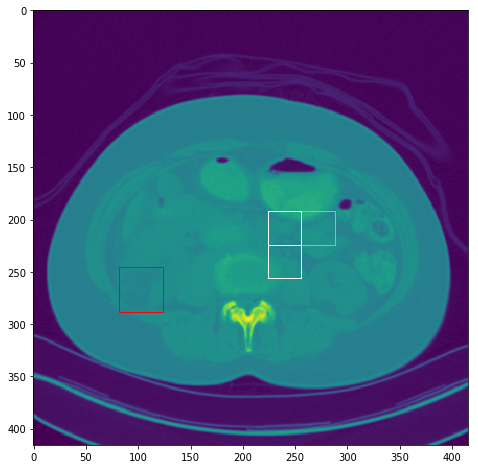

(tensor([0.3420, 0.0910, 0.0907], device='cuda:0'), tensor([ 98,  84, 112], device='cuda:0'))
tensor([[ 98,  84, 112],
        [ 71,  72,  68],
        [ 69,  85,  56],
        [ 85,  95,  83],
        [100,  95,  87],
        [ 85,  93, 137],
        [ 58,  71,  59],
        [ 71,  88,  75]], device='cuda:0')


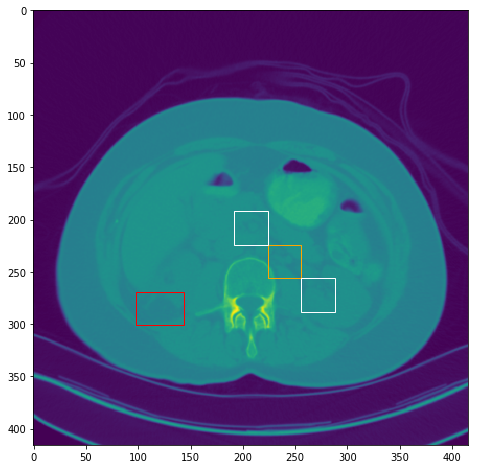

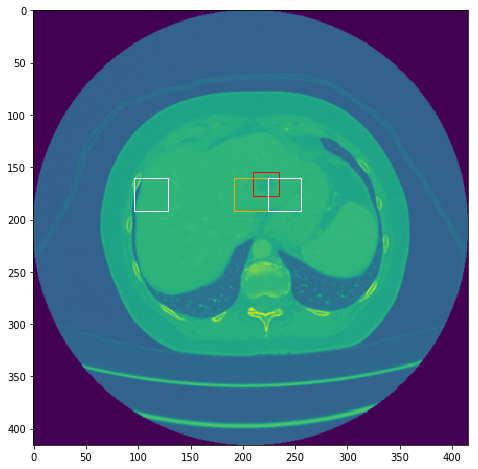

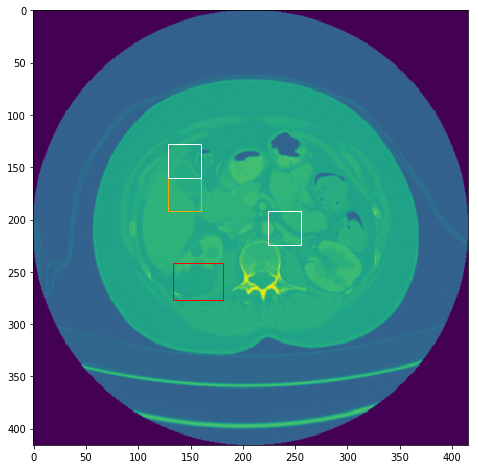

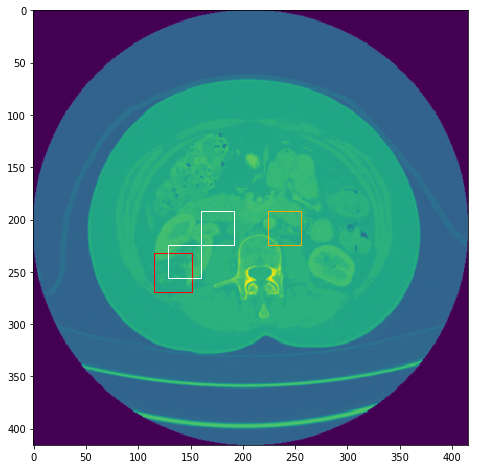

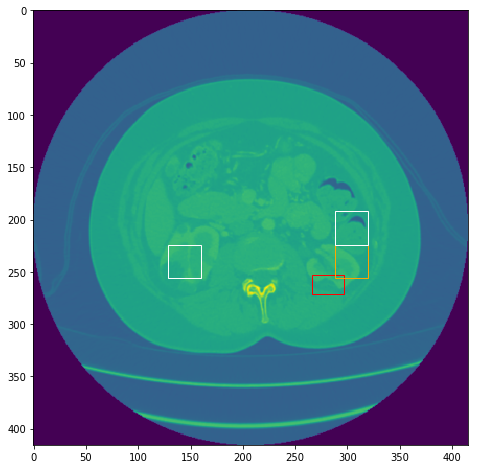

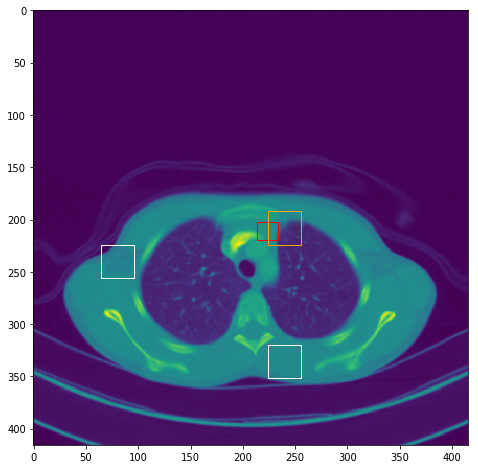

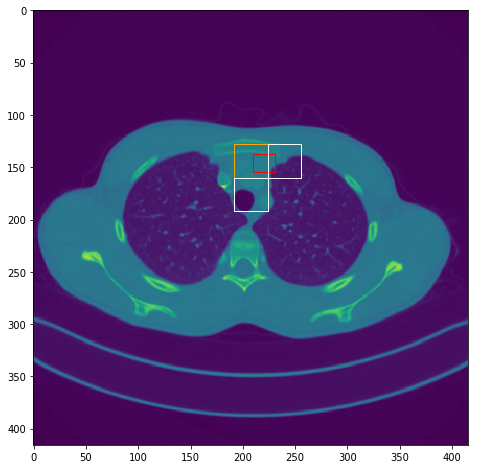

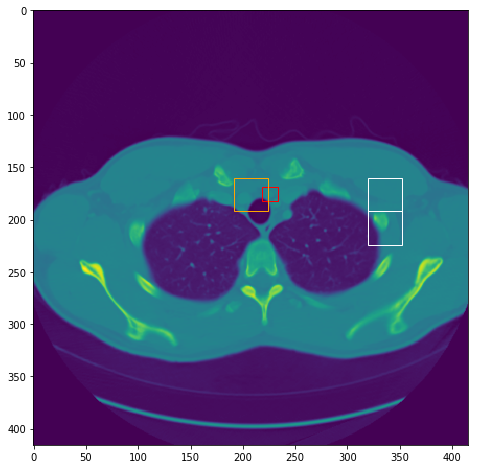

(tensor([0.1232, 0.0853, 0.0734], device='cuda:0'), tensor([72, 71, 75], device='cuda:0'))
tensor([[ 72,  71,  75],
        [ 71,  88,  56],
        [ 84, 112,  98],
        [ 84,  98,  97],
        [ 98, 112,  85],
        [101,  44, 113],
        [ 56,  61,  87],
        [ 97,  57,  94]], device='cuda:0')


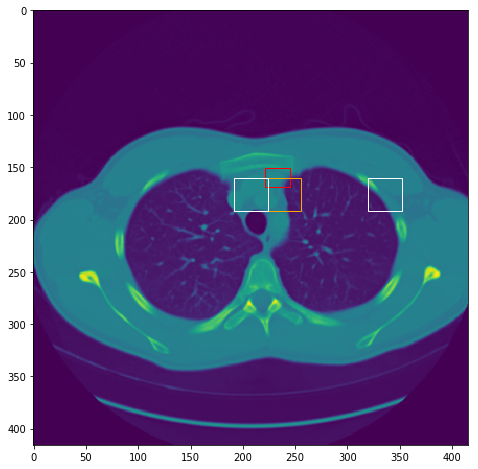

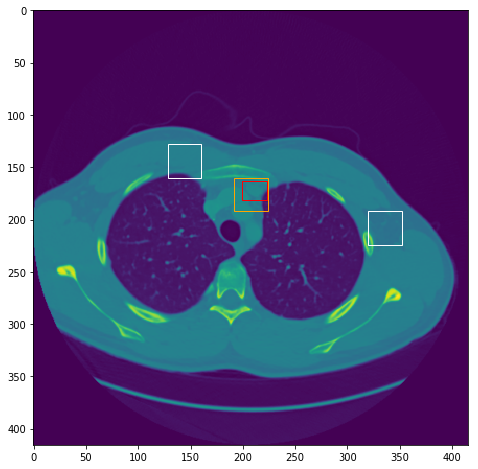

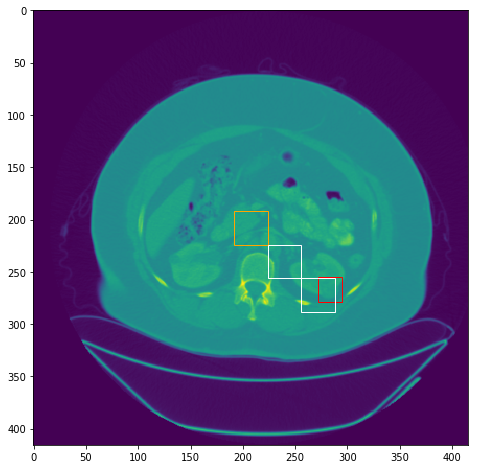

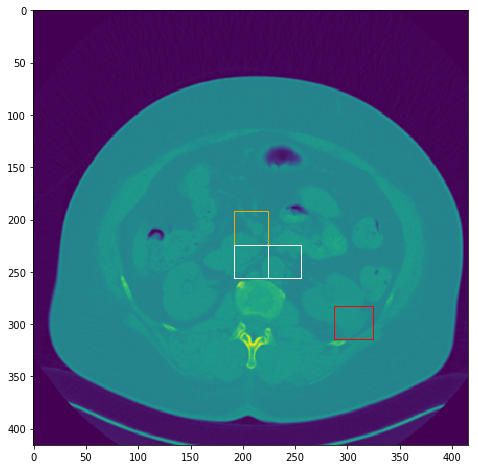

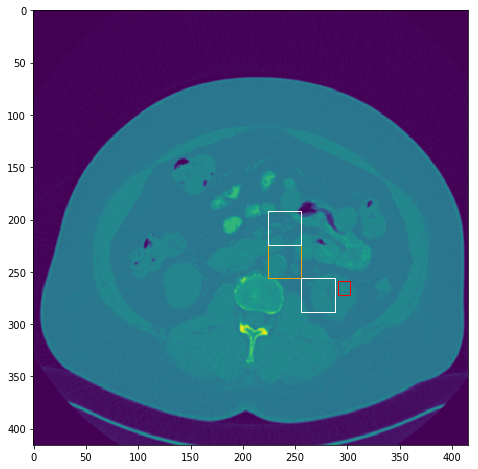

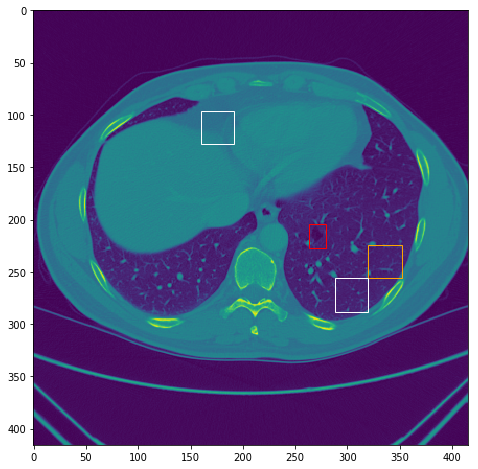

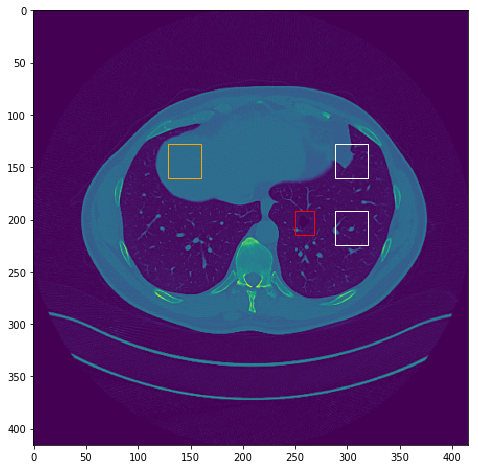

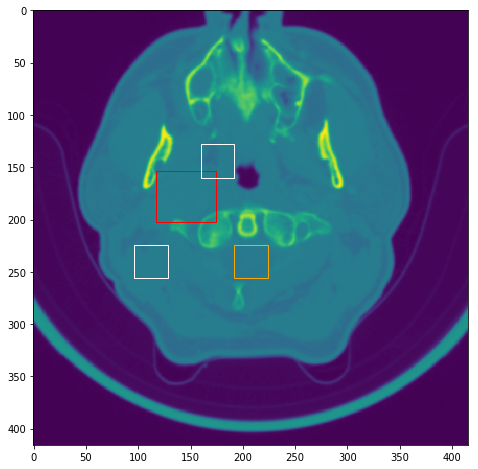

(tensor([0.2258, 0.1458, 0.1186], device='cuda:0'), tensor([71, 70, 85], device='cuda:0'))
tensor([[ 71,  70,  85],
        [ 85,  99,  83],
        [ 98,  84,  71],
        [ 85,  71,  82],
        [ 85,  94,  71],
        [ 85,  82,  71],
        [ 85,  82,  69],
        [ 99,  98, 107]], device='cuda:0')


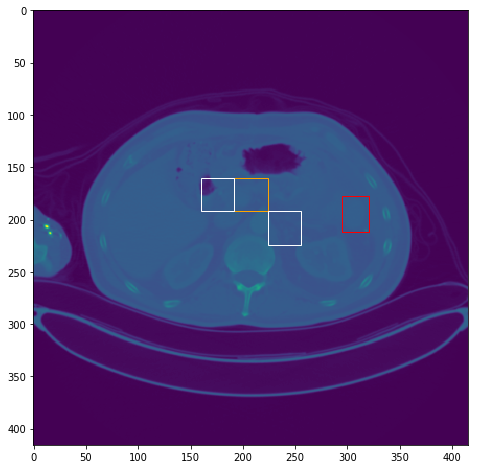

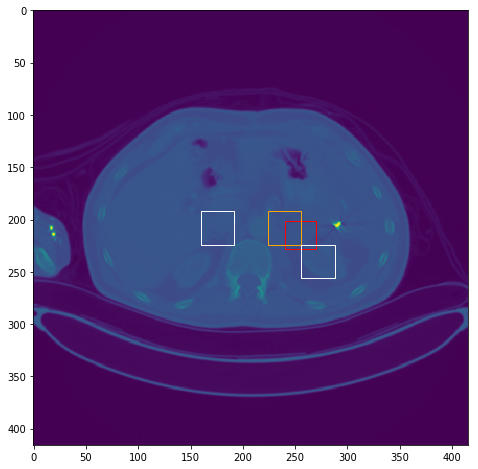

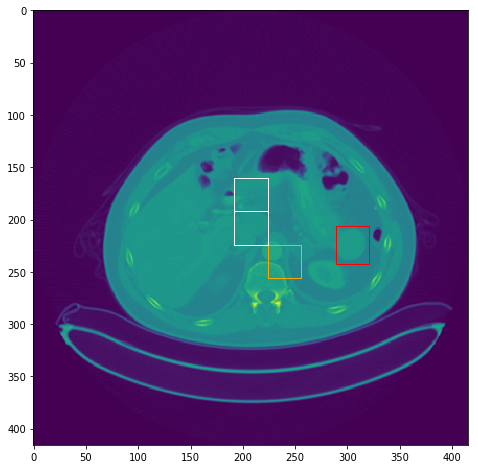

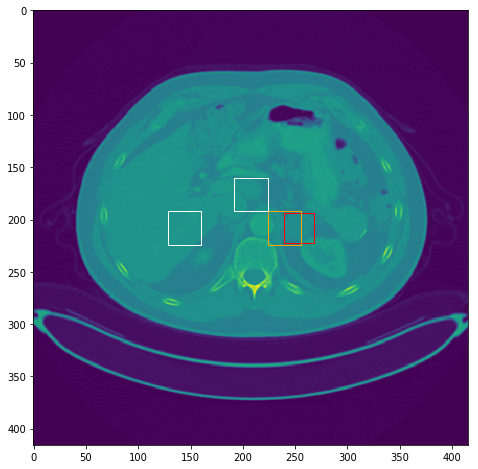

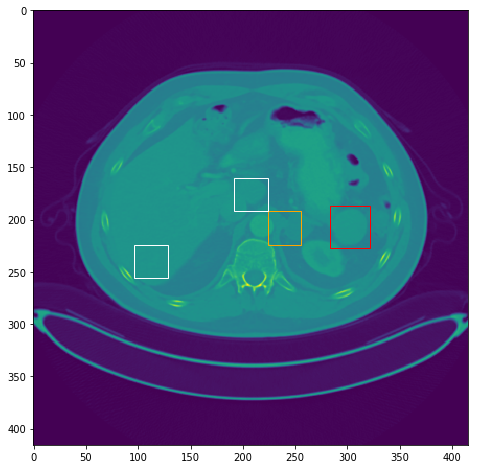

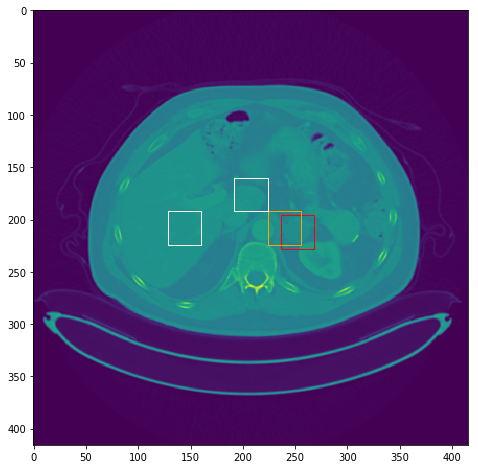

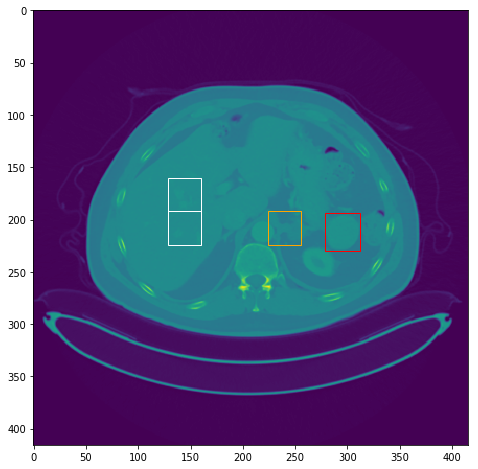

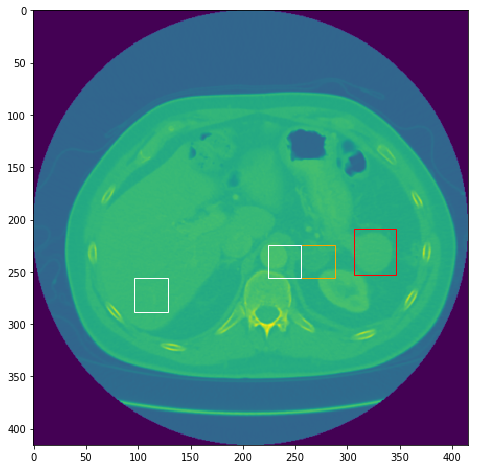

In [40]:
def visualize_model(model, num_images=6, typ='train'):
    was_training = model.training
    model.eval()
    images_so_far = 0
#     fig = plt.figure(figsize=(4, 4))

    with torch.no_grad():
        for i, (inputs, targets, bb) in enumerate(dataloaders[typ]):
            inputs = inputs.to(device)
            targets = targets.to(device)
            bb = bb.to(device)
            
            outputs = model(inputs)
            print(torch.softmax(outputs.view(-1, 13*13), 1)[0].topk(3))
            _, preds = torch.topk(outputs.view(-1, 13*13), 3, 1)
            print(preds)
#             outputs = outputs.view(-1, 13, 13, 11)
            for j in range(inputs.size()[0]):
                images_so_far += 1
#                 ax = plt.subplot(num_images//2, 2, images_so_far)
#                 ax.axis('off')
#                 ax.set_title('predicted: {}'.format(class_names[preds[j]]))
#                 p_bb = conf_bboxes(outputs[j])
                imshow(inputs.cpu().data[j], bb[j], preds[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)
visualize_model(model_ft, 32, 'test')

In [5]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(416),
        transforms.ToTensor(),
        transforms.Normalize([0], [1024])
        
                     ]),
    'test': transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(416),
        transforms.ToTensor(),
        transforms.Normalize([0], [1024])
        
                     ]),
    'val': transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(416),
        transforms.ToTensor(),
        transforms.Normalize([0], [1024])

                     ]),
}
# DeepLesionDataset('./test_set.tsv', '/media/mark/Data/deeplesion/Images_png')

file_names = {'train': '../sets/train_set_all.tsv', 
              'val': '../sets/val_set_all.tsv', 
              'test': '../sets/test_set_all.tsv'}

image_datasets = {x: DeepLesionDataset(file_names[x], '/media/mark/Data/deeplesion/Images_png',
                                          data_transforms[x])
                  for x in ['train', 'val', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=8,
                                             shuffle=False, num_workers=4)
              for x in ['train', 'val', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
# class_names = image_datasets['train']['labels']



device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

In [6]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25, verbosity=1):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_loss = 1000000.0
    loss_plot = {'train': [], 'val': []}#, 'test': []}
    acc_plot = {'train': [], 'val': []}#, 'test': []}
    session_loss = {'train': 0.0, 'val': 0.0}
    session_accuracy = {'train': 0.0, 'val': 0.0}
    session_count = {'train': 0, 'val': 0}
    e_best_acc = {'train': 0.0, 'val': 0.0}
    for epoch in range(num_epochs):
#         if epoch % verbosity == 0:
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0.0
            # Iterate over data.
            for inputs, targets, bb in dataloaders[phase]:
                inputs = inputs.to(device)
                targets = targets.to(device)
                
                # zero the parameter gradients
                optimizer.zero_grad()
                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                     
                    outputs = model(inputs)
                    _, preds = torch.max(outputs.view(-1, 13*13), 1)
                    _, t = torch.max(targets.view(-1, 13*13), 1)
                    loss = criterion(outputs.view(-1, 13*13), t)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == t)


            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double()  / dataset_sizes[phase]
            if epoch_acc > e_best_acc[phase]:
                e_best_acc[phase] = epoch_acc
            session_loss[phase] += epoch_loss
            session_accuracy[phase] += epoch_acc
            session_count[phase] += 1
#             print('{} Loss: {:.4f} Acc: {:.4f}'.format(
#                 phase, 
#                 epoch_loss, 
#                 epoch_acc))
            if epoch % verbosity == 0:
#                 print(preds.item(), t.item())
                print('{} Avg Loss: {:.4f} Avg Acc: {:.4f} Best Acc: {:.4f}'.format(
                    phase, 
                    session_loss[phase]/session_count[phase], 
                    session_accuracy[phase]/session_count[phase],
                    e_best_acc[phase]
                ))
                session_loss[phase] = 0.0
                session_accuracy[phase] = 0.0
                session_count[phase] = 0
                e_best_acc[phase] = 0.0
#                 visualize_model(model, 1, phase)
            loss_plot[phase].append(epoch_loss)
            acc_plot[phase].append(epoch_acc)
    
#             # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
#                 best_model_wts = copy.deepcopy(model.state_dict())
#             p_bb = conf_bboxes(outputs[0])
#             t_bb = conf_bboxes(targets[0])
#             imshow(inputs[0].cpu(), t_bb, p_bb)

#         print()
    fig = plt.figure(figsize=(6, 6))
    plt.plot(loss_plot['train'], label='train')
    plt.plot(loss_plot['val'], label='val')
#     plt.plot(loss_plot['test'], label='test')
    plt.legend()
    plt.show()
    fig = plt.figure(figsize=(6, 6))
    plt.plot(acc_plot['train'], label='train')
    plt.plot(acc_plot['val'], label='val')
#     plt.plot(acc_plot['test'], label='test')
    plt.legend()
    plt.show()
#     visualize_model(model, 1, 'train')
#     visualize_model(model, 1, 'val')
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Loss: {:4f}'.format(best_loss))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    torch.save(model, '../weights/last_train_{}.pt'.format(datetime.strftime(datetime.now(), '%Y_%m_%d_%H_%M')))
    model.load_state_dict(best_model_wts)
    torch.save(model, '../weights/best_val_{}.pt'.format(datetime.strftime(datetime.now(), '%Y_%m_%d_%H_%M')))
#     visualize_model(model, 16, typ='train')
    return model

In [7]:
class YOLONet(torch.nn.Module):
    def __init__(self):
        # I would like to keep image in houndfield units but it might be tricky
        # Dont know if I should use their windows or not - probably should start with this
        """
        YOLO layout
        inp : 448 x 448 x 3 

        1: (conv (7 x 7) x 64 -> mp (2 x 2) x s2 ) x 2
        out: 112 x 112 x 64
        2: (conv (3 x 3) x 192) -> mp (2 x 2) x s2) x 1
        out: 56 x 56 x 192
        3: conv:
            (1 x 1) x 128
            (3 x 3) x 256
            (1 x 1) x 256
            (3 x 3) x 512
           mp: (2 x 2) x s2
        out: 28 x 28 x 512
        4: conv:
            (1 x 1) x 256 -| x 4
            (3 x 3) x 512 -|
            (1 x 1) x 512
            (3 x 3) x 1024
           mp: (2 x 2) x s2
        out: 14 x 14 x 1024  ### possibly keep at this resolution for higher res grid
        5: conv:
            (1 x 1) x 512  -| x 2
            (3 x 3) x 1024 -|
            (3 x 3) x 1024
            (3 x 3) x 1024 s2
        out: 7 x 7 x 1024
        6: conv:
            ((3 x 3) x 1024) x 2
        out: 7 x 7 x 1024
        7: FC -> 4096
        8: FC -> 7x7x10
        """
        
        
        
        super(YOLONet, self).__init__()
        # in : 448 x 448 x 1
        # out: 112 x 112 x 64
        self.features1 = torch.nn.Sequential( 
            nn.Conv2d(1, 32, 3, padding=1),
            nn.BatchNorm2d(32, momentum=0.1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, stride=2), # 448 -> 224
            
            nn.Conv2d(32, 64, 3, padding=1),
#             nn.BatchNorm2d(64, momentum=0.1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, stride=2), # 224 -> 112
            
            nn.Conv2d(64, 128, 3, padding=1),
#             nn.BatchNorm2d(128, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(128, 64, 1, padding=0),
#             nn.BatchNorm2d(64, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(64, 128, 3, padding=1),
#             nn.BatchNorm2d(128, momentum=0.1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, stride=2), # 112 -> 56
            
            nn.Conv2d(128, 256, 3, padding=1),
#             nn.BatchNorm2d(256, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(256, 128, 1, padding=0),
#             nn.BatchNorm2d(128, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256, momentum=0.1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, stride=2), # 56 -> 28
            
            nn.Conv2d(256, 512, 3, padding=1),
#             nn.BatchNorm2d(512, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(512, 256, 1, padding=0),
#             nn.BatchNorm2d(256, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(256, 512, 3, padding=1),
#             nn.BatchNorm2d(512, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(512, 256, 1, padding=0),
#             nn.BatchNorm2d(256, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(256, 512, 3, padding=1),
            nn.BatchNorm2d(512, momentum=0.1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2, stride=2), # 28 -> 14
        )
        
        self.features2 = nn.Sequential( 
            
            nn.Conv2d(512, 1024, 3, padding=1),
#             nn.BatchNorm2d(1024, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(1024, 512, 1, padding=0),
#             nn.BatchNorm2d(512, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(512, 1024, 3, padding=1),
#             nn.BatchNorm2d(1024, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(1024, 512, 1, padding=0),
#             nn.BatchNorm2d(512, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(512, 1024, 3, padding=1),
#             nn.BatchNorm2d(1024, momentum=0.1),
            nn.LeakyReLU()

        )

        self.output1 = nn.Sequential( 
            nn.Conv2d(1024, 1024, 3, padding=1),
#             nn.BatchNorm2d(1024, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(1024, 1024, 3, padding=1),
#             nn.BatchNorm2d(1024, momentum=0.1),
#             nn.LeakyReLU(),
            nn.Conv2d(1024, 1024, 3, padding=1),
#             nn.BatchNorm2d(1024, momentum=0.1),
            nn.LeakyReLU()
        )
        
        self.output2 = nn.Sequential(
            nn.Conv2d(1024 + 512, 1, 1),
            #nn.BatchNorm2d(11, momentum=0.1),
#             nn.LeakyReLU(0.1)
        )
        self.dropout = torch.nn.Dropout2d()
        
        self.classification = nn.Conv2d(1024, 1, 1)

    def forward(self, x):
        """
        In the forward function we accept a Tensor of input data and we must return
        a Tensor of output data. We can use Modules defined in the constructor as
        well as arbitrary (differentiable) operations on Tensors.
        """
        tmp = self.features1(x)

        x = self.features2(tmp)
        x = self.dropout(x)
#         x = self.classification(x)
        x = self.output1(x)
#         x = self.dropout(x)
        x = torch.cat((x, tmp), dim=1)
        x = self.output2(x)
        return x
# model_ft = YOLONet()
# model_ft.to(device)
# for inputs, target in dataloaders['train']:
#     break
#     inputs = inputs.to(device)
#     target = target.to(device)
#     pred = model_ft(inputs)
#     print(pred.shape)
# #     pred = pred.view(inputs.size()[0], 7, 7, 11)
# #     conf_bboxes()
# #     print(target)
# #     print(pred.view(inputs.size()[0], 7, 7, 11))
#     break

In [8]:
model_ft = YOLONet()
model_ft = model_ft.to(device)

# criterion = nn.SmoothL1Loss(reduction='sum')#reduction='sum')
# criterion = yoloLoss(13, 2, 1)
criterion = nn.CrossEntropyLoss()
# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9, weight_decay=0.01)
# optimizer_ft = optim.Adam(model_ft.parameters(), lr=0.001)

# Decay LR by a factor of 0.1 every 24 epochs
# exp_lr_scheduler = None#lr_scheduler.StepLR(optimizer_ft, step_size=100, gamma=0.1)

Epoch 0/99
----------
train Avg Loss: 3.5962 Avg Acc: 0.1016 Best Acc: 0.1016
val Avg Loss: 3.5405 Avg Acc: 0.1272 Best Acc: 0.1272
Epoch 1/99
----------
Epoch 2/99
----------
Epoch 3/99
----------
Epoch 4/99
----------
Epoch 5/99
----------
Epoch 6/99
----------
Epoch 7/99
----------
Epoch 8/99
----------
Epoch 9/99
----------
Epoch 10/99
----------
train Avg Loss: 3.0823 Avg Acc: 0.2145 Best Acc: 0.2535
val Avg Loss: 3.1636 Avg Acc: 0.1998 Best Acc: 0.2463
Epoch 11/99
----------
Epoch 12/99
----------
Epoch 13/99
----------
Epoch 14/99
----------
Epoch 15/99
----------
Epoch 16/99
----------
Epoch 17/99
----------
Epoch 18/99
----------
Epoch 19/99
----------
Epoch 20/99
----------
train Avg Loss: 2.7854 Avg Acc: 0.2755 Best Acc: 0.2882
val Avg Loss: 3.0582 Avg Acc: 0.2282 Best Acc: 0.2549
Epoch 21/99
----------
Epoch 22/99
----------
Epoch 23/99
----------
Epoch 24/99
----------
Epoch 25/99
----------
Epoch 26/99
----------
Epoch 27/99
----------
Epoch 28/99
----------
Epoch 29/99
-

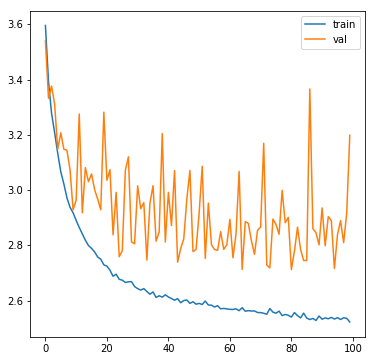

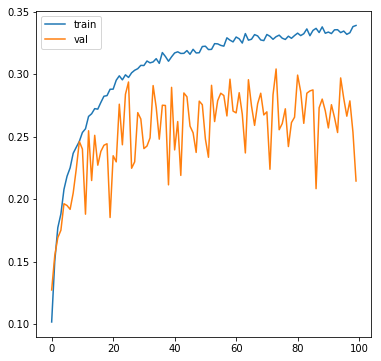

Training complete in 1447m 46s
Best val Loss: 2.712591
Best val Acc: 0.304357


/home/mark/miniconda3/envs/2018_health/lib/python3.6/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type YOLONet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [9]:
model_ft = train_model(model_ft, criterion, optimizer_ft, None,
                       num_epochs=100, verbosity=10)

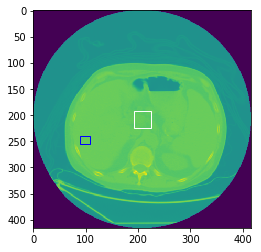

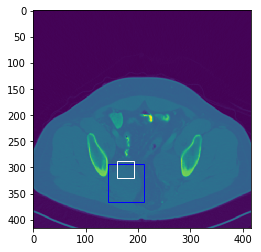

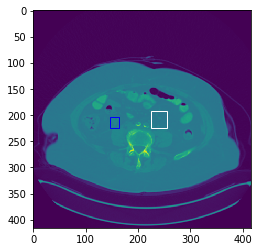

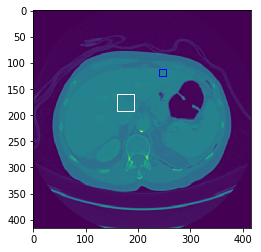

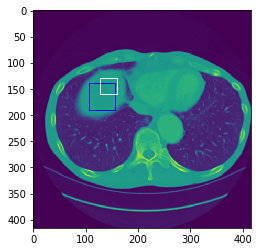

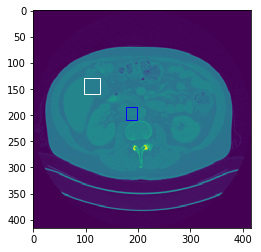

Exception ignored in: <bound method _DataLoaderIter.__del__ of <torch.utils.data.dataloader._DataLoaderIter object at 0x7fd72175ef98>>
Traceback (most recent call last):
  File "/home/mark/miniconda3/envs/2018_health/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 399, in __del__
    self._shutdown_workers()
  File "/home/mark/miniconda3/envs/2018_health/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 378, in _shutdown_workers
    self.worker_result_queue.get()
  File "/home/mark/miniconda3/envs/2018_health/lib/python3.6/multiprocessing/queues.py", line 337, in get
    return _ForkingPickler.loads(res)
  File "/home/mark/miniconda3/envs/2018_health/lib/python3.6/site-packages/torch/multiprocessing/reductions.py", line 151, in rebuild_storage_fd
    fd = df.detach()
  File "/home/mark/miniconda3/envs/2018_health/lib/python3.6/multiprocessing/resource_sharer.py", line 57, in detach
    with _resource_sharer.get_connection(self._id) as conn:
  File "/ho

In [10]:
visualize_model(model_ft, 6, 'train')

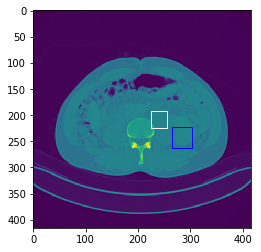

In [11]:
visualize_model(model_ft, 1, typ='val')

tensor([[136, 125,  85],
        [111,  74,  42],
        [ 93, 125, 120],
        [ 82,  96,  99],
        [ 98,  97,  84],
        [ 55,  84,  70],
        [ 83,  96,  71],
        [ 82,  73,  70]], device='cuda:0')


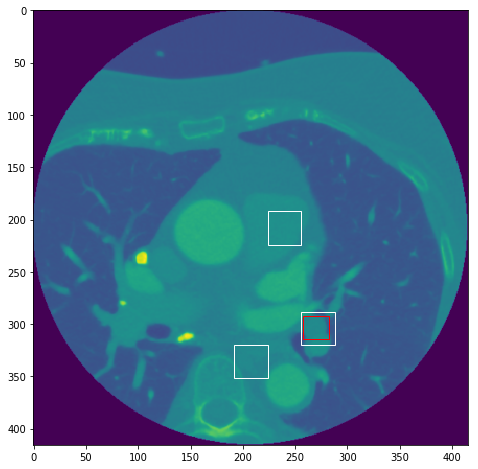

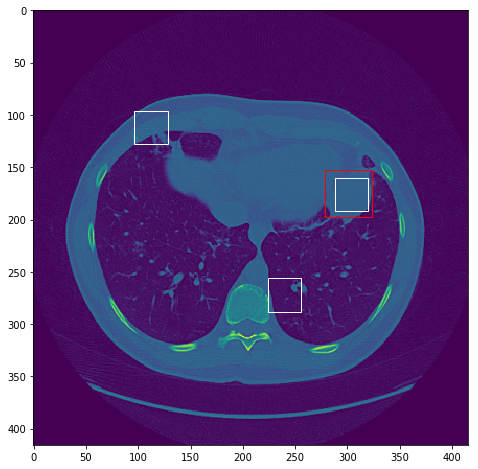

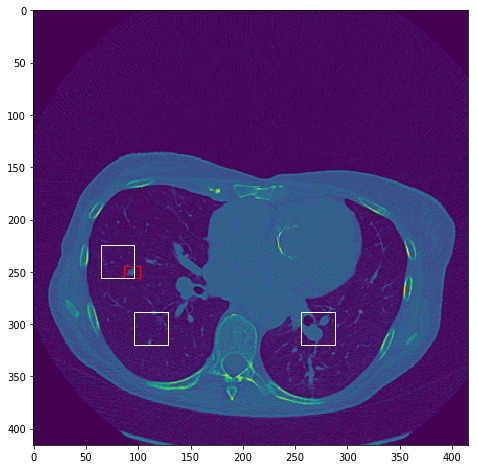

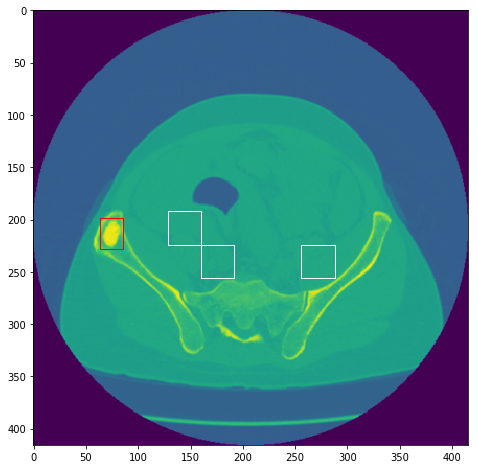

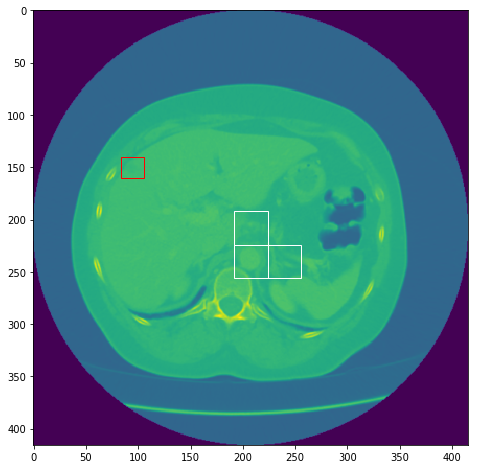

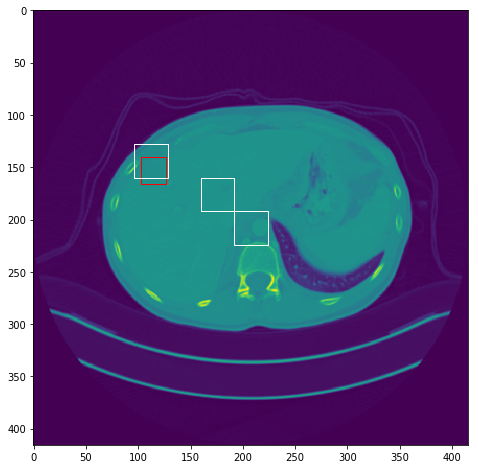

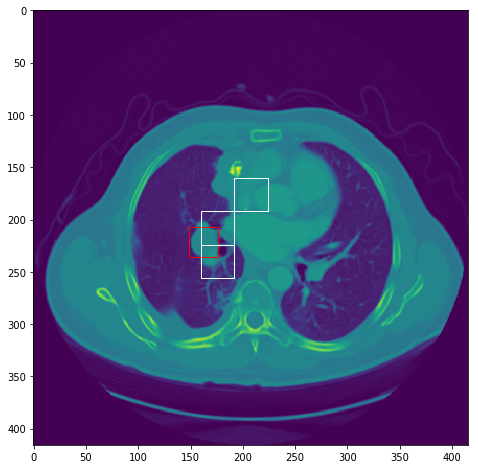

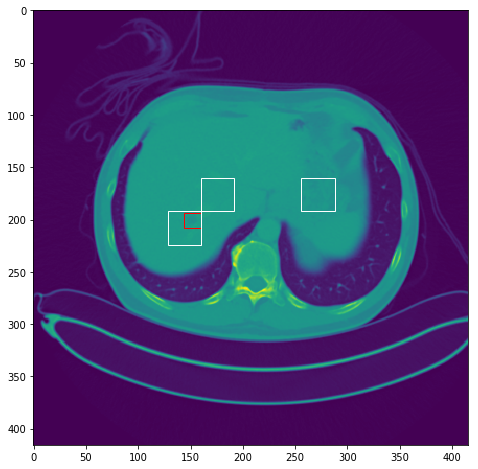

tensor([[ 69,  68,  70],
        [108, 101,  59],
        [ 97,  58,  57],
        [ 71,  72,  85],
        [ 85,  69,  57],
        [ 98,  85,  84],
        [ 68,  84, 106],
        [107,  68, 120]], device='cuda:0')


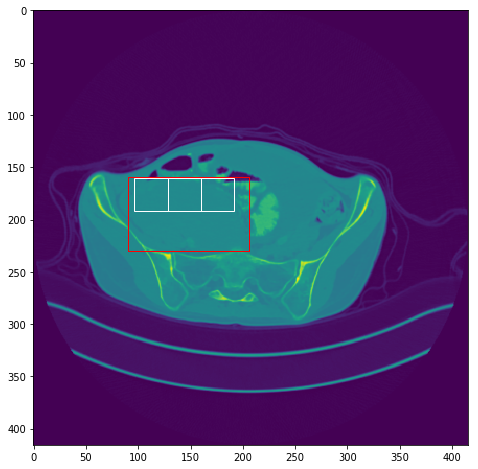

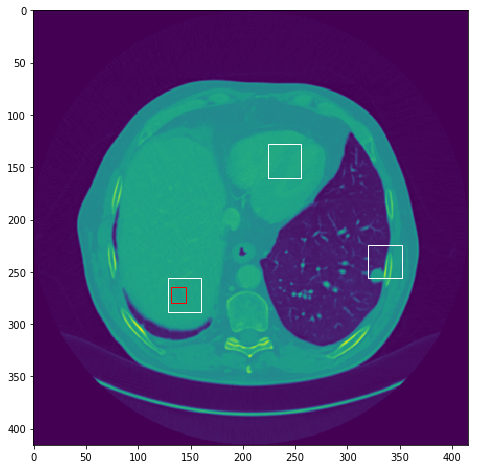

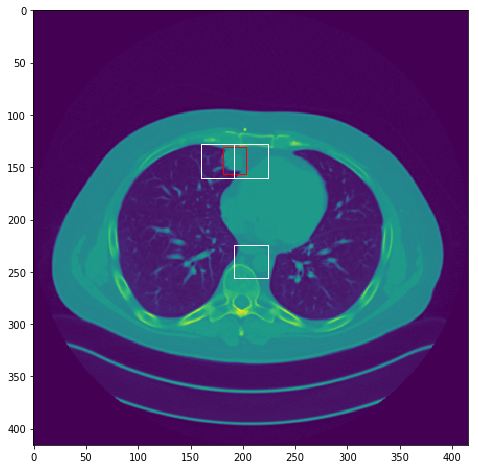

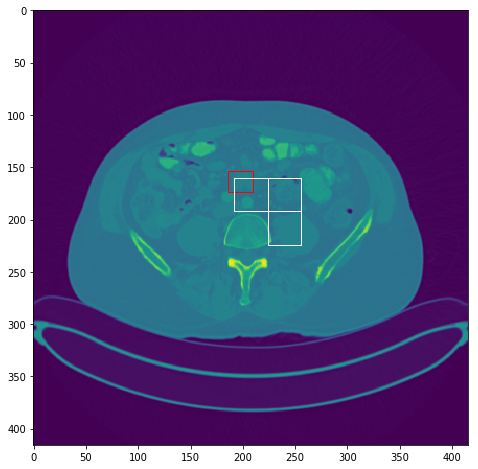

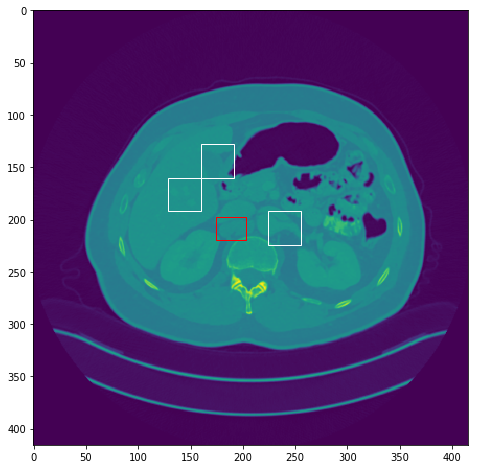

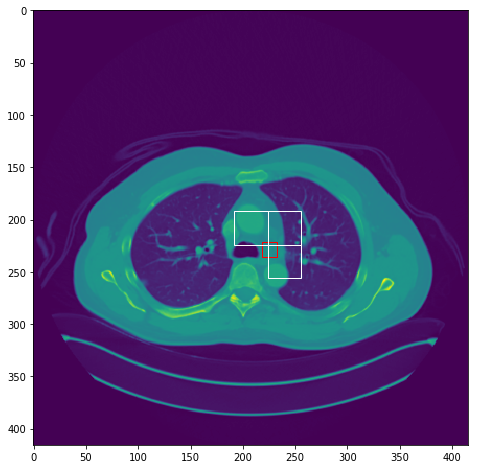

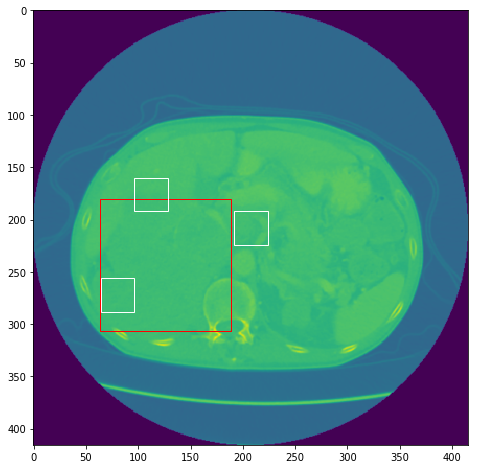

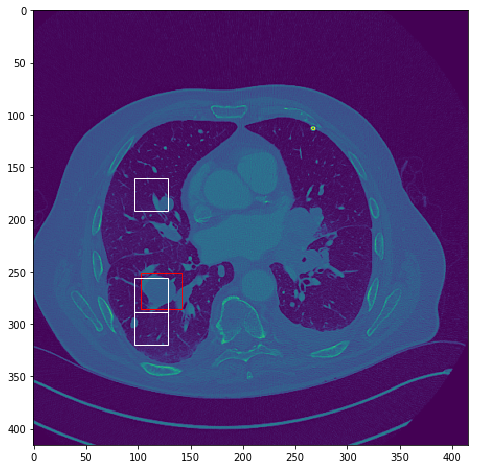

tensor([[ 82, 110,  84],
        [ 85,  71,  84],
        [ 84,  83,  85],
        [ 86,  72,  85],
        [ 85,  56,  59],
        [ 67,  99,  94],
        [ 85,  72,  84],
        [ 58,  70,  87]], device='cuda:0')


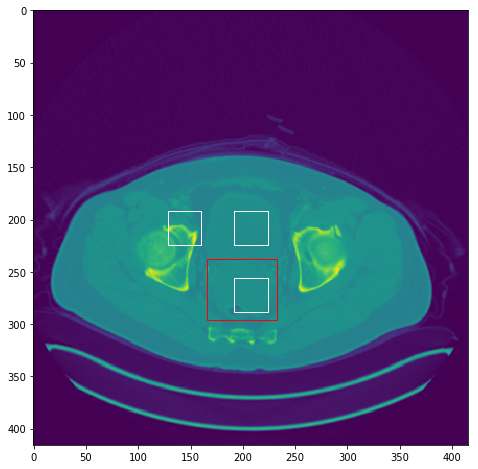

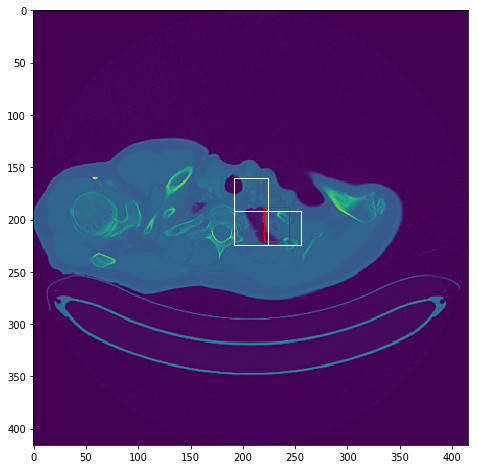

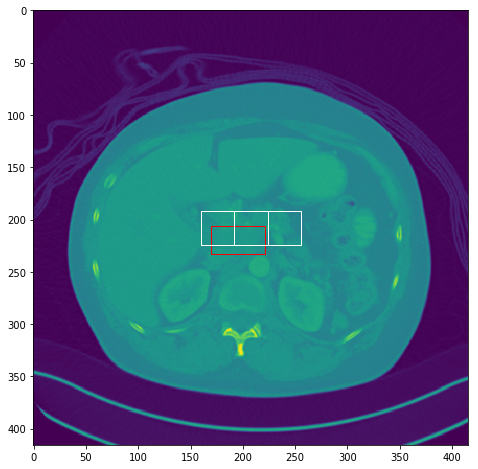

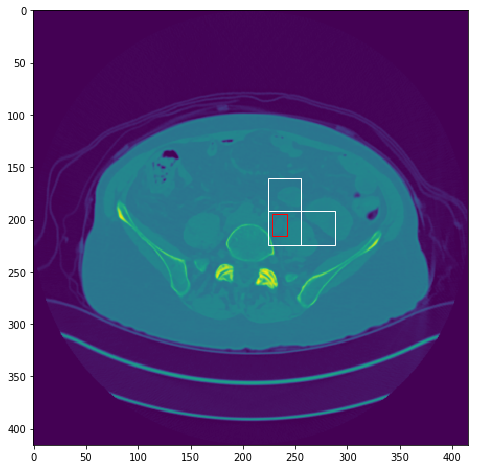

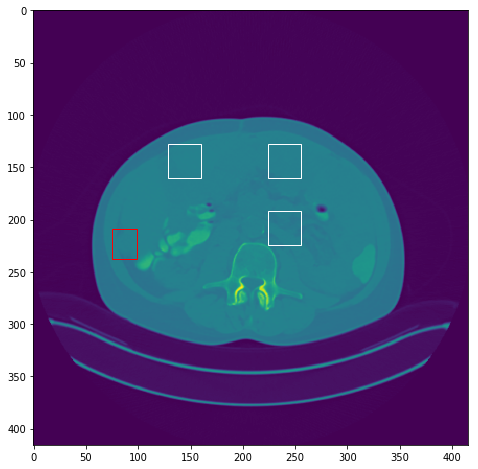

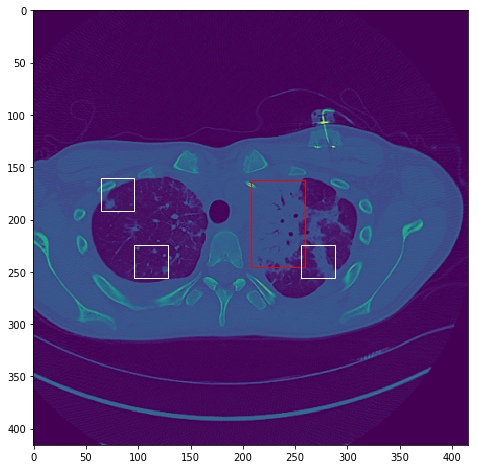

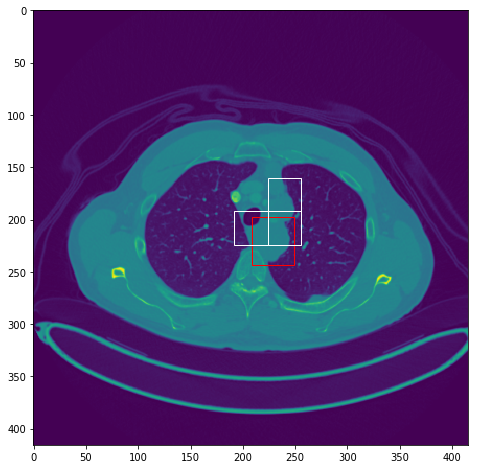

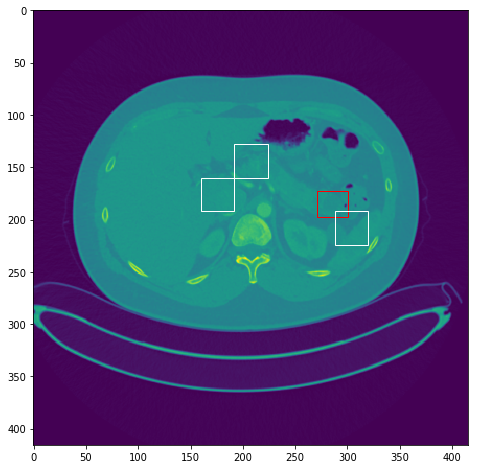

tensor([[121, 113, 108],
        [ 85,  55,  68],
        [ 69,  84,  99],
        [112,  83, 111],
        [ 81,  88,  87],
        [ 85,  56,  84],
        [ 98,  82,  83],
        [100,  59, 125]], device='cuda:0')


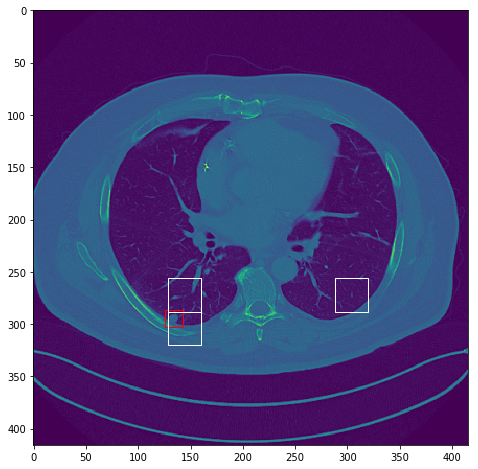

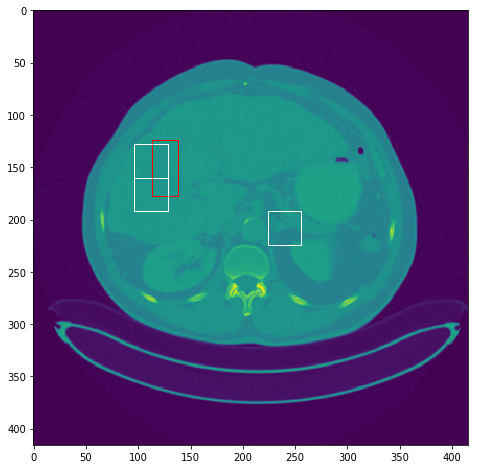

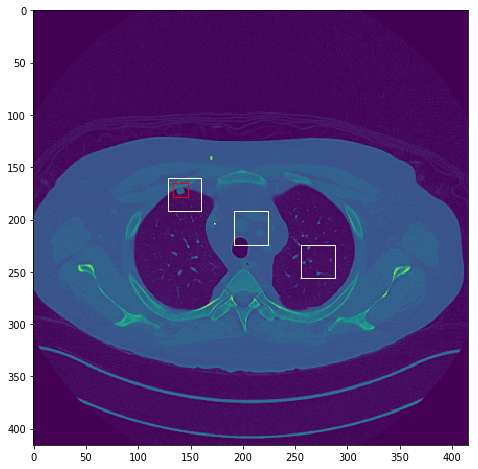

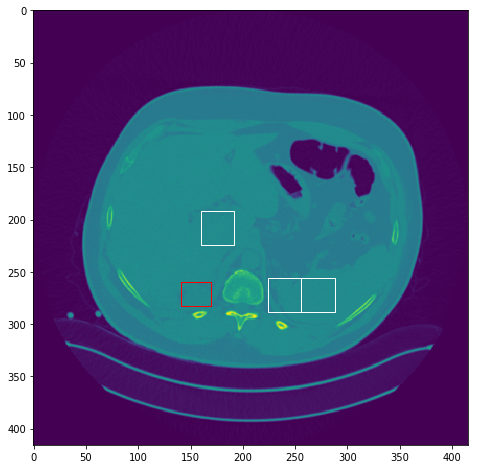

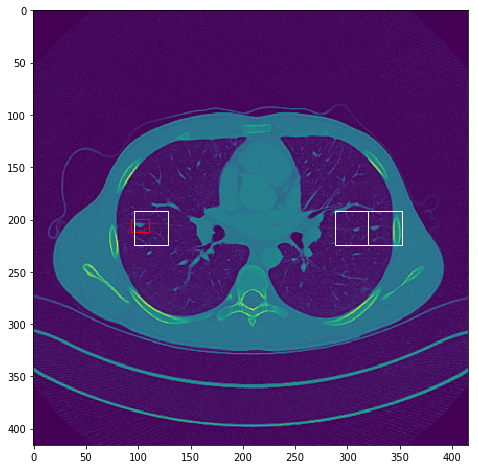

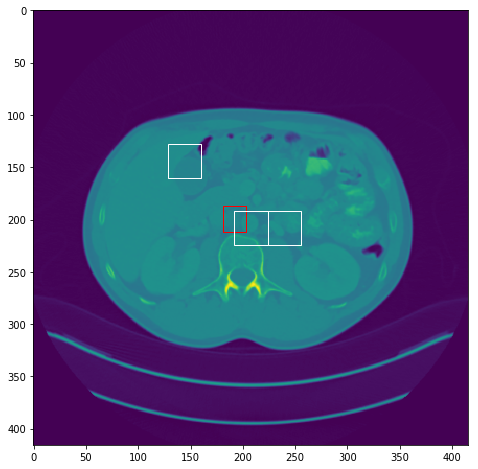

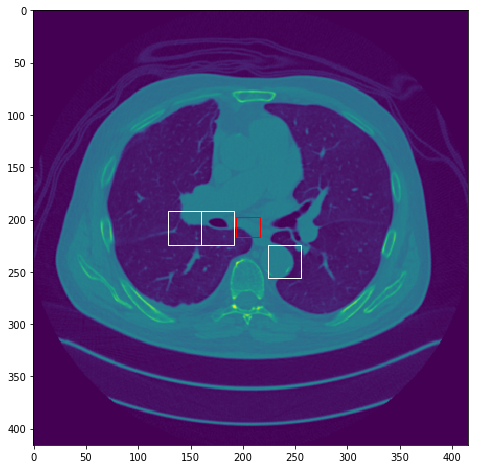

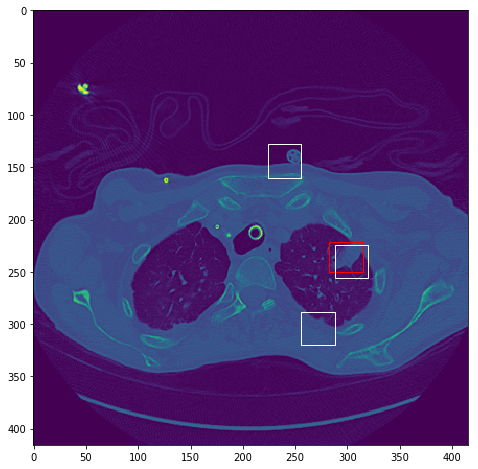

In [43]:
visualize_model(model_ft, 32, typ='test')

In [8]:
model_ft = YOLONet()
model_ft = torch.load('../weights/best_val_2018_12_04_14_36.pt')


In [62]:
model_ft.eval()
all_pred = []
running_corrects = 0
for inputs, targets, bb in dataloaders['test']:
    inputs = inputs.to(device)
    targets = targets.to(device)
    outputs = model_ft(inputs)
    _, preds = torch.topk(outputs.view(-1, 13*13), 5, 1)
    _, t = torch.max(targets.view(-1, 13*13), 1)

    running_corrects += np.sum(
        (preds[:,0] == t).cpu().numpy() |  \
        (preds[:,1] == t).cpu().numpy() |  \
        (preds[:,2] == t).cpu().numpy() |  \
        (preds[:,3] == t).cpu().numpy() |  \
        (preds[:,4] == t).cpu().numpy())
#     all_pred_v.extend((preds == t).cpu().numpy())
#     break

print(running_corrects  / dataset_sizes['test'])
# print(all_pred)
# true_label = np.ones(len(all_pred))
#     pred = pred.view(inputs.size()[0], 7, 7, 11)
#     conf_bboxes()
#     print(target)
#     print(pred.view(inputs.size()[0], 7, 7, 11))

0.6257357418307287


In [16]:
print(sum(all_pred) / len(all_pred))

0.3095189770651512


[1. 1. 1. ... 1. 1. 1.]
[0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 

Text(0.5, 1.0, '2-class Precision-Recall curve: AP=1.00')

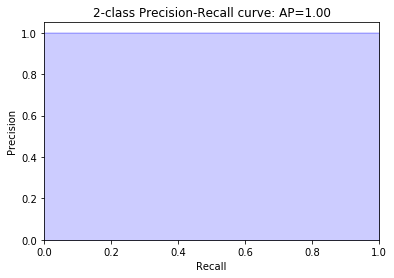

In [24]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.utils.fixes import signature
from sklearn.metrics import average_precision_score

print(true_label)
print(all_pred)

average_precision = average_precision_score(true_label, true_label)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))

precision, recall, _ = precision_recall_curve(true_label, all_pred)

# In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})
plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
          average_precision))

In [13]:
# for inputs, targets, bb in dataloaders['train']:
#     inputs = inputs.to(device)
#     targets = targets.to(device)
#     outputs = model_ft(inputs)
#     _, preds = torch.max(outputs.view(-1, 13*13), 1)
#     _, t = torch.max(targets.view(-1, 13*13), 1)
#     print(preds)
#     print(t)
#     print(preds == t)
# #     pred = pred.view(inputs.size()[0], 7, 7, 11)
# #     conf_bboxes()
# #     print(target)
# #     print(pred.view(inputs.size()[0], 7, 7, 11))


In [23]:
from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
import numpy as np

iris = datasets.load_iris()
X = iris.data
y = iris.target

# Add noisy features
random_state = np.random.RandomState(0)
n_samples, n_features = X.shape
X = np.c_[X, random_state.randn(n_samples, 200 * n_features)]

# Limit to the two first classes, and split into training and test
X_train, X_test, y_train, y_test = train_test_split(X[y < 2], y[y < 2],
                                                    test_size=.5,
                                                    random_state=random_state)
y_test
# Create a simple classifier
# classifier = svm.LinearSVC(random_state=random_state)
# classifier.fit(X_train, y_train)
# y_score = classifier.decision_function(X_test)

# from sklearn.metrics import precision_recall_curve
# import matplotlib.pyplot as plt
# from sklearn.utils.fixes import signature

# precision, recall, _ = precision_recall_curve(y_test, y_score > 0)

# # In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
# step_kwargs = ({'step': 'post'}
#                if 'step' in signature(plt.fill_between).parameters
#                else {})
# plt.step(recall, precision, color='b', alpha=0.2,
#          where='post')
# plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.ylim([0.0, 1.05])
# plt.xlim([0.0, 1.0])
# plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
#           average_precision))

array([1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 0])

In [14]:
# model_ft = YOLONet()
# pp = 0
# for p in model_ft.parameters():
#     if p.requires_grad:
#         n_n=1
#         for s in list(p.size()):
#             n_n = n_n*s
#         pp += n_n
# print(pp)

In [15]:
# model_ft = models.resnet50(pretrained=False)
# model_ft